# mouse brain

In [1]:
import matplotlib.pyplot as plt
from spider import SPIDER
op = SPIDER()
import anndata
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np

# use cpus only
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
TF_ENABLE_ONEDNN_OPTS = 0

2023-06-25 16:26:33.669811: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-06-25 16:26:33.679473: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-25 16:26:33.762191: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-25 16:26:33.763046: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-25 16:26:34.655275: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [3]:
sample_name = 'mousebrain'
ds = 'slide-seq-v2'
out_f = f'../datasets/{ds}/{sample_name}/'
adata = anndata.read_h5ad(f'{out_f}/adata.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 41786 × 4000
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'cluster_key', 'coord_type', 'gearyC', 'hvg', 'is_human', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'deconvolution_results', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [5]:
adata.obsm['deconvolution_results']

,Interneurons,Subiculum_Entorhinal_cl2,Subiculum_Entorhinal_cl3,DentatePyramids,CA1_CA2_CA3_Subiculum,Mural,Astrocytes,Oligodendrocytes,Polydendrocytes,Microglia,Ependymal,Endothelial_Tip,Neurogenesis,Endothelial_Stalk,barcode,max_cell_type,maxval,thresh_ct
AACGTCATAATCGT,0.113249,0.203010,0.086060,0.247319,0.153769,0.002455,0.072134,0.022327,0.008712,0.065562,0.003853,0.000000,0.000000,0.021550,AACGTCATAATCGT,4,0.247319,0.0
TACTTTAGCGCAGT,0.055718,0.077973,0.048517,0.187755,0.195889,0.040198,0.126317,0.071605,0.052353,0.013668,0.016075,0.044060,0.012159,0.057714,TACTTTAGCGCAGT,5,0.195889,0.0
CATGCCTGGGTTCG,0.108751,0.228845,0.109581,0.246070,0.115723,0.006306,0.071186,0.015768,0.000000,0.059735,0.000000,0.013702,0.000000,0.024332,CATGCCTGGGTTCG,4,0.246070,0.0
TCGATATGGCACAA,0.108163,0.029694,0.112905,0.172960,0.122573,0.014295,0.065901,0.031834,0.096153,0.034155,0.094124,0.065322,0.011114,0.040808,TCGATATGGCACAA,4,0.172960,0.0
TTATCTGACGAAGC,0.065790,0.236463,0.012458,0.233441,0.145091,0.014810,0.097935,0.052590,0.023642,0.008578,0.014275,0.058715,0.000000,0.036213,TTATCTGACGAAGC,2,0.236463,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CACCCGATGACTCC,0.189667,0.000000,0.000000,0.037157,0.007935,0.000000,0.000000,0.246184,0.392414,0.094163,0.000000,0.000000,0.016853,0.015627,CACCCGATGACTCC,9,0.392414,0.0
CTTGATTAGGCAGG,0.375533,0.123520,0.000000,0.036172,0.003471,0.000000,0.033918,0.006818,0.024570,0.308541,0.000000,0.078775,0.008685,0.000000,CTTGATTAGGCAGG,1,0.375533,0.0
GAGTTCCTAAGCGG,0.063493,0.050532,0.135440,0.349993,0.257504,0.000000,0.116491,0.000000,0.019085,0.000000,0.000000,0.000000,0.007462,0.000000,GAGTTCCTAAGCGG,4,0.349993,0.0
GCGCTCAGTGCTCT,0.313457,0.000000,0.000000,0.324040,0.061320,0.032552,0.000000,0.000000,0.086062,0.000000,0.000000,0.000000,0.000000,0.182568,GCGCTCAGTGCTCT,4,0.324040,0.0


In [6]:
no_spatalk = False
if len(adata) > 10000:
    no_spatalk=True
idata = op.prep(adata, out_f, R_path, cluster_key=adata.uns['cluster_key'], is_human=adata.uns['is_human'], coord_type=adata.uns['coord_type'], no_spatalk=no_spatalk)
idata, meta_idata = op.find_svi(idata, out_f, R_path, alpha=0.3)
idata.write_h5ad(f'{out_f}/idata.h5ad')


In [6]:
idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')

metrics

Using the results from SVI identification methods: ['SOMDE' 'SpatialDE' 'SPARKX' 'nnSVG' 'scGCO' 'gearyC' 'moranI']
188/188 SVIs identified (threshold=0.01).
evaluating with ['moranI' 'gearyC' 'SOMDE' 'nnSVG']


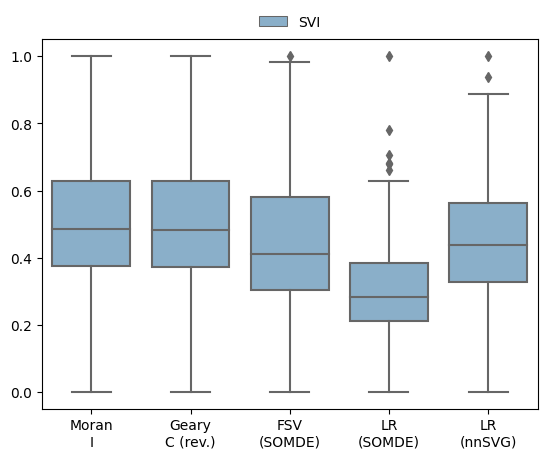

In [4]:
svi_df, svi_df_strict = op.svi.combine_SVI(idata,threshold=0.01)
op.svi.eva_SVI(idata, svi_df_strict)
plt.savefig(f'../figures/{ds}_{sample_name}_metric.png', dpi=300,bbox_inches='tight')

100%|██████████| 1000/1000 [05:59<00:00,  2.78/s]


Mouse KEGG_2019_Mouse
Using mouse LR pair dataset.
50
0.29785379706656556 0.1348194701533406 0.05931934414862475


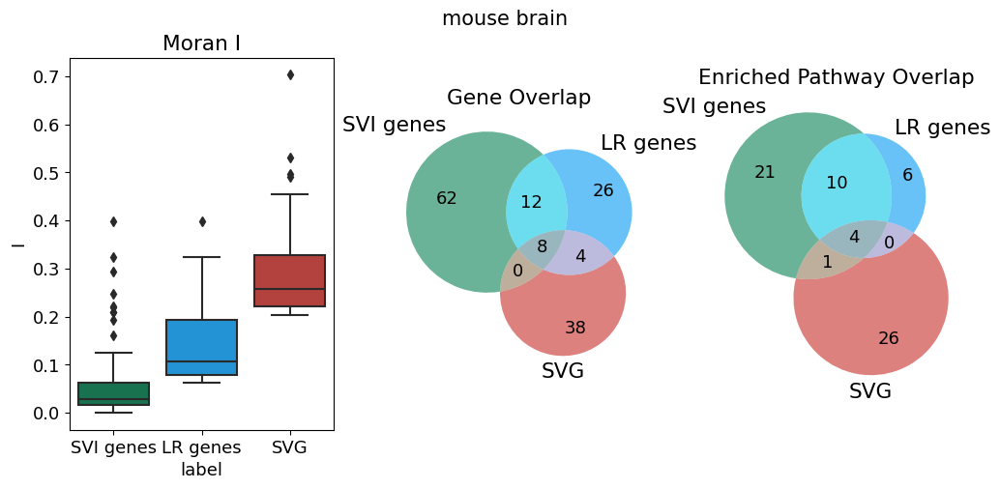

In [4]:
op.util.adata_moranI(adata, out_f=out_f)
plt.rcParams['font.size'] = 13
merged_df,lri_pw_list,gene_lr_list,gene_pw_list = op.vis.svg_svi_relation(adata, idata, title='mouse brain', is_human=adata.uns['is_human'], top=50)
plt.savefig(f'../figures/{ds}_{sample_name}_relation.png', dpi=600,bbox_inches='tight')

In [5]:
import gseapy
membership=pd.get_dummies(merged_df.set_index('Term')['group']).groupby('Term').sum().astype(str).agg('-'.join, axis=1)
merged_df['group name'] = membership.loc[merged_df.Term].to_numpy()
rename_dict = {
    '1-0-0': 'LR', '1-0-1':'SVI&LR', '0-0-1':'SVI', '1-1-1':'All', '0-1-0':'SVG', '0-1-1':'SVI&SVG'
}
merged_df['group name'] = merged_df['group name'] .astype('category').cat.rename_categories(rename_dict).to_numpy()
op.vis.enrichment(merged_df,x_key='group name', cutoff=0.05, top_term=20,size=15,save=f'../figures/{ds}_{sample_name}_relation_enrichment.png')

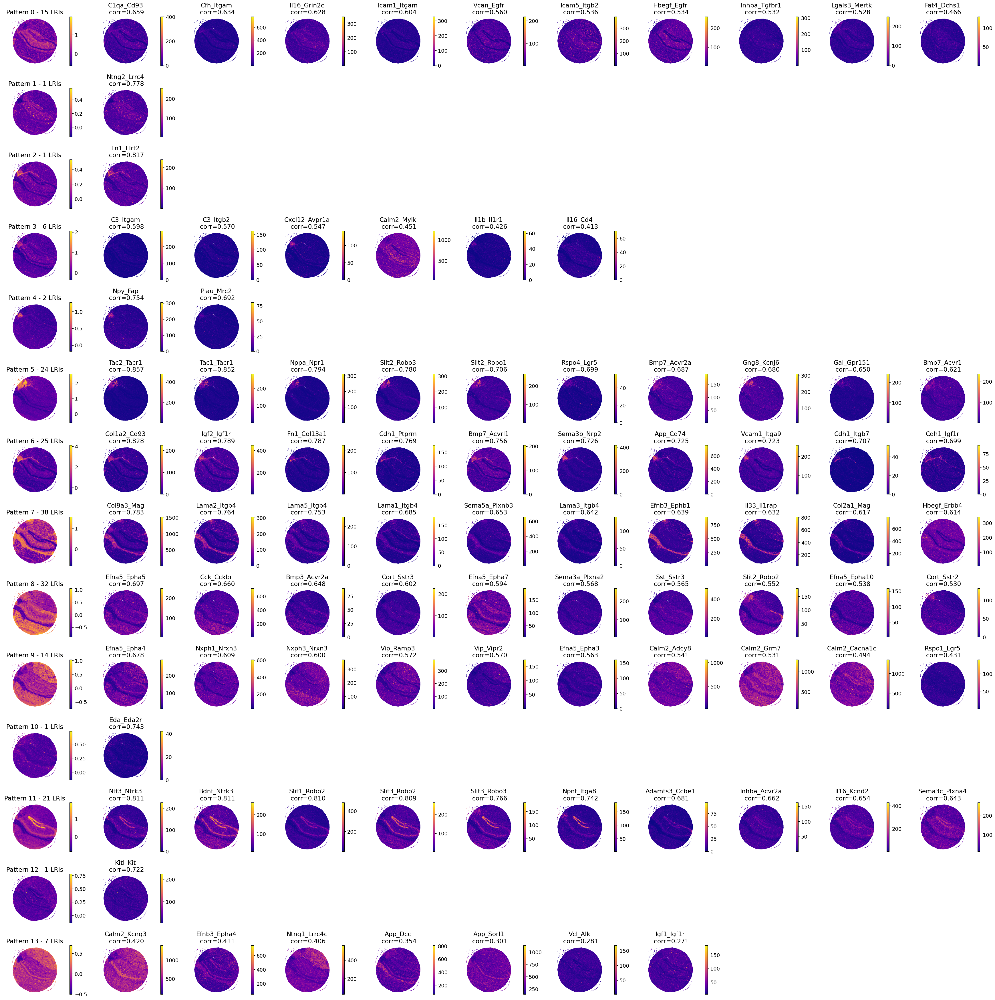

In [7]:
op.vis.pattern_LRI(idata,show_SVI=10, spot_size=1)
plt.tight_layout()
plt.savefig(f'../figures/{ds}_{sample_name}_patterns.png', dpi=600,bbox_inches='tight')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

9_no vs. 9_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.696e-09 U_stat=8.500e+01
10_no vs. 10_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.319e-03 U_stat=0.000e+00
11_no vs. 11_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.822e-13 U_stat=7.600e+01
12_no vs. 12_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.319e-03 U_stat=0.000e+00
13_no vs. 13_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.406e-09 U_stat=2.500e+01
8_no vs. 8_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.977e-16 U_stat=2.650e+02
1_no vs. 1_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg co

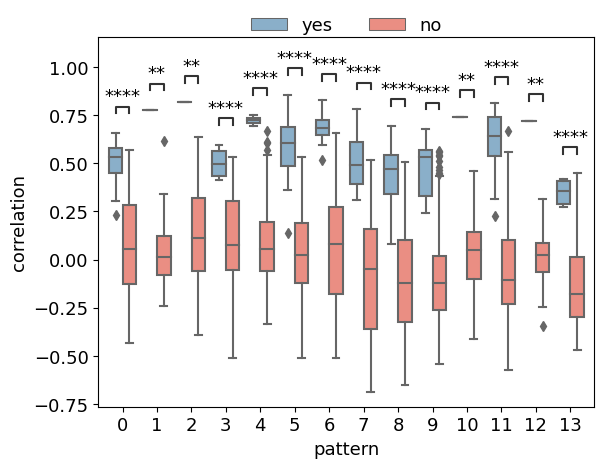

In [6]:
op.svi.eva_pattern(idata)
plt.savefig(f'../figures/{ds}_{sample_name}_pattern_metric.png', dpi=600,bbox_inches='tight')


In [9]:
merged_df_edge, arr = op.er.pattern_enrichment_edge(idata,is_human=adata.uns['is_human'])
merged_df_node, arr = op.er.pattern_enrichment_node(idata,is_human=adata.uns['is_human'])
op.vis.enrichment(merged_df_node,x_key='label', cutoff=0.05, top_term=20,save=f'../figures/{ds}_{sample_name}_pattern_enrichment_node.png',size=15)
try:
    op.vis.enrichment(merged_df_edge,x_key='label', cutoff=0.05, top_term=20,save=f'../figures/{ds}_{sample_name}_pattern_enrichment_edge.png')
except Exception as e:
    print(e)

Using mouse LR pair dataset.
No objects to concatenate
No objects to concatenate
No objects to concatenate
No objects to concatenate


In [8]:
idata = idata[:, idata.var['is_svi']==1]

In [9]:
adata, adata_lri, adata_pattern = op.cell_transform(idata, adata, label=adata.uns['cluster_key'])

Added key cell_pattern in idata.uns
Added key cell_score in idata.uns
Added key interaction_pattern, interaction_score in adata.obsm
Added key rank_interaction_score_groups, rank_interaction_pattern_groups in adata.uns


         Falling back to preprocessing with `sc.pp.pca` and default params.


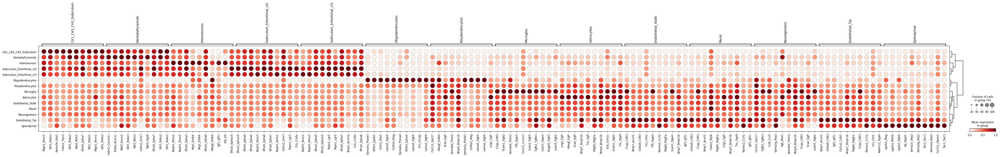

In [14]:
with plt.rc_context():
    sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', show=False)
    plt.savefig(f'../figures/{ds}_{sample_name}_label_SVI.png', bbox_inches="tight")

         Falling back to preprocessing with `sc.pp.pca` and default params.


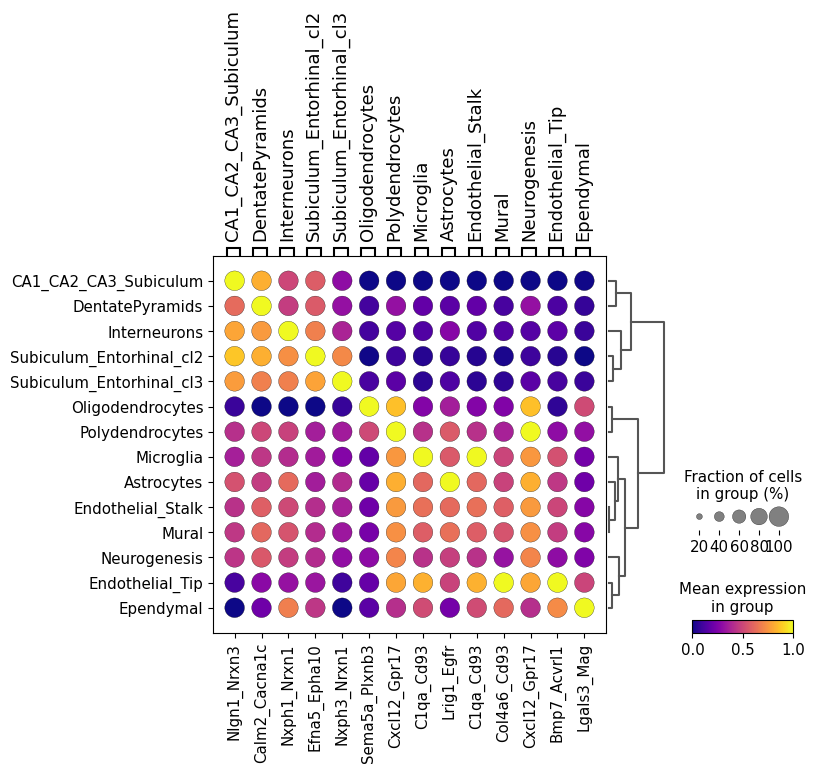

In [11]:
with plt.rc_context():
    sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', show=False, cmap='plasma', n_genes=1)
    plt.savefig(f'../figures/{ds}_{sample_name}_label_SVI1.png', bbox_inches="tight")

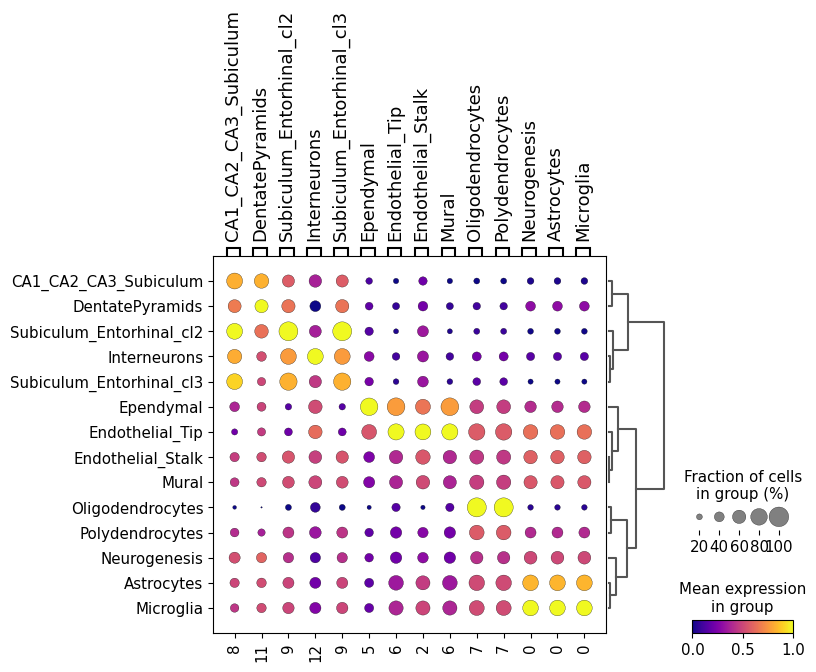

In [12]:
with plt.rc_context(): 
    sc.pl.rank_genes_groups_dotplot(adata_pattern, standard_scale='var', n_genes=1, show=False, cmap='plasma')
    plt.savefig(f'../figures/{ds}_{sample_name}_label_pattern.png', bbox_inches="tight")


In [17]:
region = adata.obsm['deconvolution_results'].loc[adata_pattern.obs_names]
from scipy import stats
pds = []
for i in adata_pattern.var_names:
    pds.append(region.corrwith(adata_pattern.to_df()[i].astype('float'), method=stats.pointbiserialr)[:1])
pds_df = pd.concat(pds)
pds_df.index = adata_pattern.var_names
useful_df = []
for cluster_i in adata.obs['cluster'].unique():
    df_sub = pds_df[pds_df[cluster_i]>0.3][cluster_i].sort_values(ascending=False)
    if len(df_sub) > 0:
        useful_df.append(df_sub)

In [18]:
useful_df

[11    0.584458
 Name: DentatePyramids, dtype: float64,
 11    0.345473
 Name: CA1_CA2_CA3_Subiculum, dtype: float64,
 9    0.426119
 8    0.341142
 Name: Subiculum_Entorhinal_cl2, dtype: float64,
 7     0.573777
 10    0.413829
 Name: Oligodendrocytes, dtype: float64,
 0    0.501049
 Name: Astrocytes, dtype: float64,
 5    0.365171
 Name: Ependymal, dtype: float64,
 6    0.434789
 2    0.336505
 Name: Endothelial_Tip, dtype: float64]

In [22]:
patterns = []
cluster = []
cluster_id = []
corrs = []
cluster_id_map = {
    'DentatePyramids': 'Dentate Pyramids',
    'Endothelial_Tip': 'Endothelial Tip',
    'Oligodendrocytes': 'Oligodendrocytes',
    'Astrocytes': 'Astrocytes',
    'Ependymal': 'Ependymal',
    'CA1_CA2_CA3_Subiculum': "CA1/CA2/CA3 Subiculum",
    'Subiculum_Entorhinal_cl2': "Subiculum Entorhinal cl2"
}
for x in useful_df:
    patterns.append(int(x.idxmax()))
    corrs.append(x.max())
    cluster_id.append(x.name)
    cluster.append(cluster_id_map[x.name])

In [23]:
cluster

['Dentate Pyramids',
 'CA1/CA2/CA3 Subiculum',
 'Subiculum Entorhinal cl2',
 'Oligodendrocytes',
 'Astrocytes',
 'Ependymal',
 'Endothelial Tip']

['Ntf3_Ntrk3' 'Bdnf_Ntrk3']
['Ntf3_Ntrk3' 'Bdnf_Ntrk3']
['Efna5_Epha4' 'Nxph1_Nrxn3']
['Col9a3_Mag' 'Lama2_Itgb4']
['C1qa_Cd93' 'Cfh_Itgam']
['Tac2_Tacr1' 'Tac1_Tacr1']
['Col1a2_Cd93' 'Igf2_Igf1r']


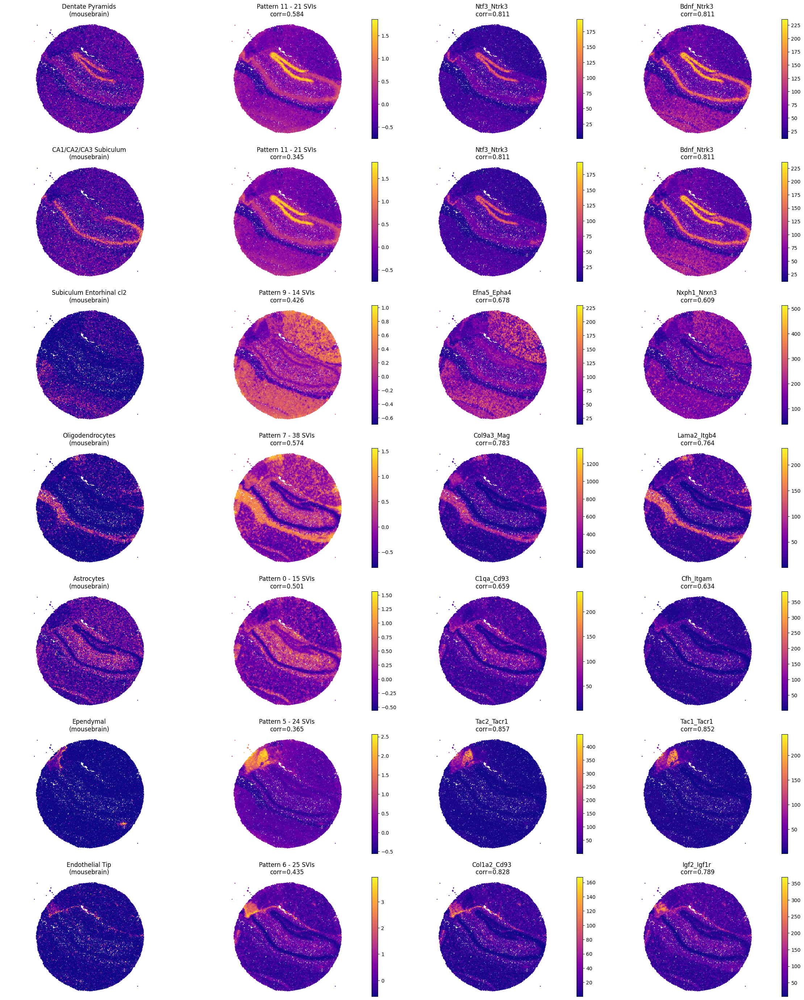

In [24]:
useful_df = []
adata_lri.obsm['spatial'] = adata[adata_lri.obs_names].obsm['spatial']
adata_pattern.obsm['spatial'] = adata[adata_lri.obs_names].obsm['spatial']

plt.figure(figsize=(7*4, 5*len(patterns)))
base = 1
for i in range(len(patterns)):
    corr =  corrs[i]
    cluster_name = cluster[i]
    cluster_i = cluster_id[i]

    plt.subplot(len(patterns), 4, base)

    plt.scatter(adata.obsm['spatial'][:,0],adata.obsm['spatial'][:,1], c=adata.obsm['deconvolution_results'][cluster_i], s=3, cmap='plasma', edgecolors='none')
    # plt.scatter(adata[adata.obs['cluster']==cluster_id].obsm['spatial'][:,0],adata[adata.obs['cluster']==cluster_id].obsm['spatial'][:,1], c=adata[adata.obs['cluster']==cluster_name].obs['cluster']==cluster_name, s=5, cmap='plasma', vmin=0, edgecolors='none')
    plt.axis('equal')
    plt.axis('off')
    plt.title(f'{cluster_name}\n({sample_name})')
    base += 1
    
    plt.subplot(len(patterns), 4, base)
    im=plt.scatter(adata_pattern.obsm['spatial'][:,0], adata_pattern.obsm['spatial'][:,1], c=adata_pattern.to_df()[str(patterns[i])], s=3, cmap='plasma', edgecolors='none')
    plt.colorbar(im,fraction=0.046, pad=0.04)
    plt.axis('equal')
    plt.axis('off')
    plt.title(f'Pattern {patterns[i]} - {np.sum(idata.var.label == patterns[i])} SVIs\ncorr={"%.3f" % corr}')
    base += 1
    
    svis = idata.var[idata.var.label == patterns[i]].sort_values(f'pattern_correlation_{patterns[i]}', ascending=False)
    svi_to_plot = svis.index.to_numpy()[:2]
    print(svi_to_plot)
    memberships = svis[f'pattern_correlation_{patterns[i]}'].to_numpy()[:2]
    for j in range(2):
        plt.subplot(len(patterns), 4, base)
        im=plt.scatter(adata_lri.obsm['spatial'][:,0], adata_lri.obsm['spatial'][:,1], c=adata_lri.to_df()[svi_to_plot[j]], s=3, cmap='plasma', edgecolors='none',linewidths=0)
        plt.axis('equal')
        plt.axis('off')
        plt.colorbar(im,fraction=0.046, pad=0.04)
        plt.title(f'{svi_to_plot[j]}\n corr={"%.3f" % memberships[j]}')
        base += 1
plt.savefig(f'../figures/{ds}_{sample_name}_decon_pattern.pdf', dpi=100,bbox_inches='tight')

In [ ]:
region = pd.get_dummies(idata.uns['cell_meta'].loc[adata.obs_names]['cluster']).loc[adata_pattern.obs_names]
from scipy import stats
pds = []
for i in adata_pattern.var_names:
    pds.append(region.corrwith(adata_pattern.to_df()[i].astype('float'), method=stats.pointbiserialr)[:1])
pds_df = pd.concat(pds)
pds_df.index = adata_pattern.var_names
useful_df = []
for cluster_i in adata.obs['cluster'].unique():
    df_sub = pds_df[pds_df[cluster_i]>0.3][cluster_i].sort_values(ascending=False)
    if len(df_sub) > 0:
        useful_df.append(df_sub)

In [14]:
useful_df

[11    0.308023
 Name: DentatePyramids, dtype: float64,
 7     0.451584
 10    0.337285
 Name: Oligodendrocytes, dtype: float64,
 0    0.339764
 Name: Astrocytes, dtype: float64,
 5    0.316733
 Name: Ependymal, dtype: float64,
 6    0.362354
 Name: Endothelial_Tip, dtype: float64]

In [33]:
patterns = []
cluster = []
cluster_id = []
corrs = []
cluster_id_map = {
    'DentatePyramids': 'Dentate Pyramids',
    'Endothelial_Tip': 'Endothelial Tip',
    'Oligodendrocytes': 'Oligodendrocytes',
    'Astrocytes': 'Astrocytes',
    'Ependymal': 'Ependymal'
}
for x in useful_df:
    patterns.append(int(x.idxmax()))
    corrs.append(x.max())
    cluster_id.append(x.name)
    cluster.append(cluster_id_map[x.name])

['Ntf3_Ntrk3' 'Bdnf_Ntrk3']
['Col9a3_Mag' 'Lama2_Itgb4']
['C1qa_Cd93' 'Cfh_Itgam']
['Tac2_Tacr1' 'Tac1_Tacr1']
['Col1a2_Cd93' 'Igf2_Igf1r']


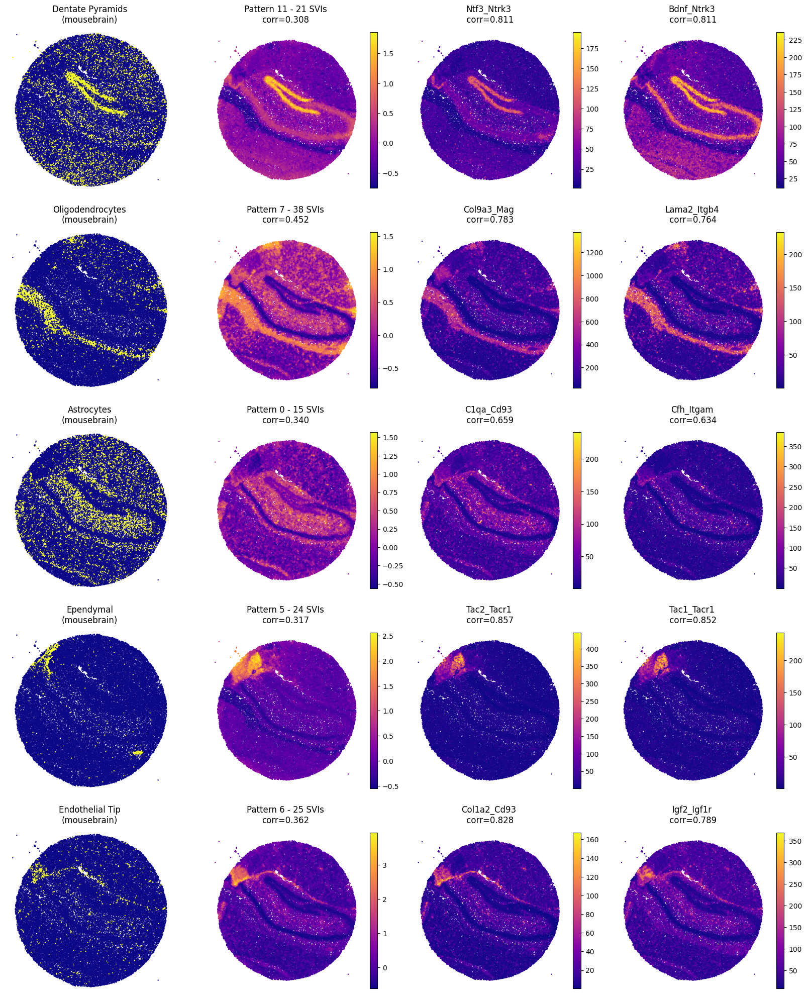

In [40]:
useful_df = []
adata_lri.obsm['spatial'] = adata[adata_lri.obs_names].obsm['spatial']
adata_pattern.obsm['spatial'] = adata[adata_lri.obs_names].obsm['spatial']

plt.figure(figsize=(5*4, 5*len(patterns)))
base = 1
for i in range(len(patterns)):
    corr =  corrs[i]
    cluster_name = cluster[i]
    cluster_i = cluster_id[i]

    plt.subplot(len(patterns), 4, base)

    plt.scatter(adata.obsm['spatial'][:,0],adata.obsm['spatial'][:,1], c=adata.obs['cluster']==cluster_i, s=3, cmap='plasma', edgecolors='none')
    # plt.scatter(adata[adata.obs['cluster']==cluster_id].obsm['spatial'][:,0],adata[adata.obs['cluster']==cluster_id].obsm['spatial'][:,1], c=adata[adata.obs['cluster']==cluster_name].obs['cluster']==cluster_name, s=5, cmap='plasma', vmin=0, edgecolors='none')
    plt.axis('equal')
    plt.axis('off')
    plt.title(f'{cluster_name}\n({sample_name})')
    base += 1
    
    plt.subplot(len(patterns), 4, base)
    im=plt.scatter(adata_pattern.obsm['spatial'][:,0], adata_pattern.obsm['spatial'][:,1], c=adata_pattern.to_df()[str(patterns[i])], s=3, cmap='plasma', edgecolors='none')
    plt.colorbar(im,fraction=0.046, pad=0.04)
    plt.axis('equal')
    plt.axis('off')
    plt.title(f'Pattern {patterns[i]} - {np.sum(idata.var.label == patterns[i])} SVIs\ncorr={"%.3f" % corr}')
    base += 1
    
    svis = idata.var[idata.var.label == patterns[i]].sort_values(f'pattern_correlation_{patterns[i]}', ascending=False)
    svi_to_plot = svis.index.to_numpy()[:2]
    print(svi_to_plot)
    memberships = svis[f'pattern_correlation_{patterns[i]}'].to_numpy()[:2]
    for j in range(2):
        plt.subplot(len(patterns), 4, base)
        im=plt.scatter(adata_lri.obsm['spatial'][:,0], adata_lri.obsm['spatial'][:,1], c=adata_lri.to_df()[svi_to_plot[j]], s=3, cmap='plasma', edgecolors='none',linewidths=0)
        plt.axis('equal')
        plt.axis('off')
        plt.colorbar(im,fraction=0.046, pad=0.04)
        plt.title(f'{svi_to_plot[j]}\n corr={"%.3f" % memberships[j]}')
        base += 1
plt.savefig(f'../figures/{ds}_{sample_name}_cluster_pattern.png', dpi=100,bbox_inches='tight')


In [48]:
group = idata.var[idata.var['is_svi']==1]
group['g'] = group.index
group['membership'] = 1
custom, background = op.er.pathway_prep(idata,is_human=False)
merged_df_edge, arr = op.er.enrichment(custom, background, group, groupby='label')


Using mouse LR pair dataset.


In [49]:
merged_df_edge[merged_df_edge.group=='11']

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes,group,ordered_group
0,gs_ind_0,Axon guidance,2/17,0.518726,0.773945,1.461538,Slit1_Robo2;Slit1_Robo1,11,11
1,gs_ind_0,Cytokine-cytokine receptor interaction,1/18,0.872034,0.872034,0.708108,Inhba_Acvr2a,11,11
2,gs_ind_0,ECM-receptor interaction,2/9,0.207274,0.414547,3.016194,Vtn_Itga8;Npnt_Itga8,11,11
3,gs_ind_0,Focal adhesion,1/10,0.659203,0.773945,1.400000,Vtn_Itga8,11,11
4,gs_ind_0,Hedgehog signaling pathway,1/1,0.096386,0.321285,11.000000,Ihh_Cdon,11,11
5,gs_ind_0,Human papillomavirus infection,1/8,0.572270,0.773945,1.776471,Vtn_Itga8,11,11
6,gs_ind_0,Neurotrophin signaling pathway,1/1,0.096386,0.321285,11.000000,Ntf3_Ntrk3,11,11
7,gs_ind_0,PI3K-Akt signaling pathway,1/11,0.696551,0.773945,1.260870,Vtn_Itga8,11,11
8,gs_ind_0,Signaling pathways regulating pluripotency of ...,2/4,0.044607,0.321285,6.794872,Inhba_Acvr1c;Inhba_Acvr2a,11,11
9,gs_ind_0,TGF-beta signaling pathway,1/2,0.184543,0.414547,6.520000,Inhba_Acvr2a,11,11


In [50]:
enrich_df_gene_reactome, arr = op.er.enrichment_interacrtion_gene_df(group, groupby='label', is_human=False, custom_pathwaydb=['Reactome_2022'])
enrich_df_gene_reactome['ratio'] = np.array([int(x.split('/')[0])/int(x.split('/')[1]) for x in enrich_df_gene_reactome.Overlap])
enrich_df_gene_reactome['pattern_rep'] = pd.Categorical(enrich_df_gene_reactome.label).rename_categories({
    '11': 'Dentate Pyramids (11)',
    '7': 'Oligodendrocytes (7)', 
    '0': 'Astrocytes (0)', 
    '5': 'Ependymal (5)', 
    '6': 'Endothelial Tip (6)', 
})

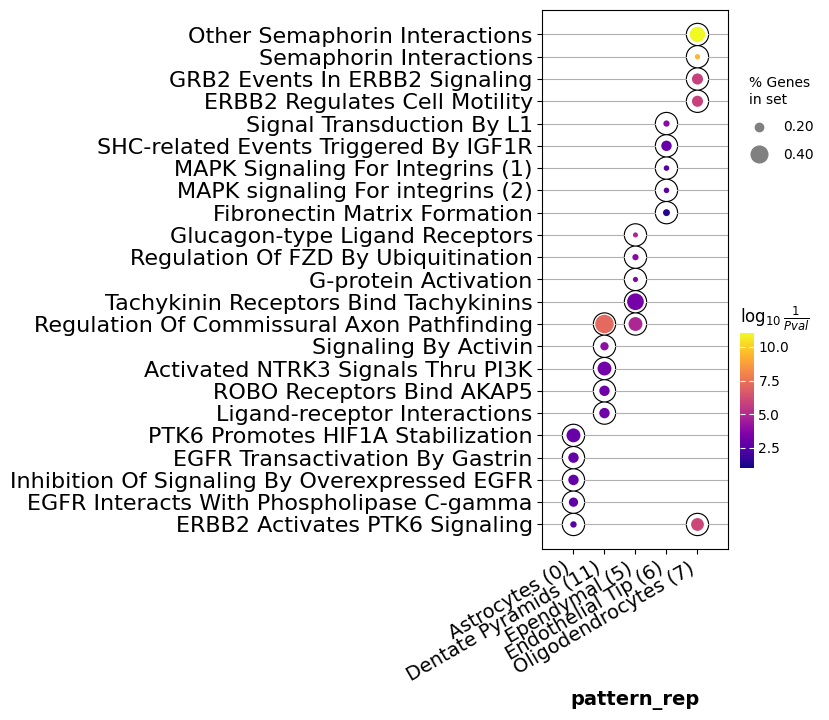

In [52]:
enrich_df_gene_reactome['Term_old'] = enrich_df_gene_reactome['Term']
enrich_df_gene_reactome['Term'] = [s.rsplit(' ', 1)[0] for s in enrich_df_gene_reactome['Term_old']]
enrich_df_gene_reactome['Term'] = enrich_df_gene_reactome['Term'].replace('p130Cas Linkage To MAPK Signaling For Integrins', 'MAPK Signaling For Integrins (1)')
enrich_df_gene_reactome['Term'] = enrich_df_gene_reactome['Term'].replace('GRB2:SOS Provides Linkage To MAPK Signaling For Integrins', 'MAPK signaling For integrins (2)')
enrich_df_gene_reactome['Term'] = enrich_df_gene_reactome['Term'].replace('Regulation Of Commissural Axon Pathfinding By SLIT And ROBO', 'Regulation Of Commissural Axon Pathfinding')
enrich_df_gene_reactome = enrich_df_gene_reactome[enrich_df_gene_reactome['Adjusted P-value']<0.05]
op.vis.enrichment(enrich_df_gene_reactome[(enrich_df_gene_reactome.label.isin(np.array(patterns, dtype=str))) & (enrich_df_gene_reactome['ratio'] > 0.12)], x_key='pattern_rep', size=5, figsize=(3,7), top_term=5, save=f'../figures/{ds}_{sample_name}_reactome_small.png')
op.vis.enrichment(enrich_df_gene_reactome[(enrich_df_gene_reactome.label.isin(np.array(patterns, dtype=str))) & (enrich_df_gene_reactome['ratio'] > 0.12)], x_key='pattern_rep', size=5, figsize=(3,10), top_term=5, save=f'../figures/{ds}_{sample_name}_reactome_large.png')
op.vis.enrichment(enrich_df_gene_reactome[(enrich_df_gene_reactome.label.isin(np.array(patterns, dtype=str))) & (enrich_df_gene_reactome['ratio'] > 0.12)], x_key='pattern_rep', size=5, figsize=(3,7), top_term=5)